## **Grand X-ray Slam**

🩺 Introduction

This project focuses on automated thoracic disease detection from chest X-ray images using deep learning.

The dataset contains labeled chest radiographs with multiple possible conditions (multi-label classification problem)

The main approach is:
1. Exploratory Data Analysis (EDA) – to understand label distribution, demographics, and dataset consistency.
2. Preprocessing & Augmentation – resize images, normalize, and apply mild augmentations especially for minority classes.
3. Modeling – use a **pretrained ResNet50** (transfer learning) fine-tuned on this dataset for feature extraction.
4. Loss Function – apply Focal Loss instead of Binary Cross-Entropy to focus more on hard-to-classify, minority class samples.
5. Evaluation – track training/validation loss and later compute metrics such as AUROC, F1-score, and per-class performance.


## Import Dependencies

In [1]:
class Config:
    # Paths
    TRAIN_CSV = "/kaggle/input/grand-xray-slam-division-a/train1.csv"
    TRAIN_IMG_DIR = "/kaggle/input/grand-xray-slam-division-a/train1"
    TEST_IMG_DIR = "/kaggle/input/grand-xray-slam-division-a/test1"
    
    # Model parameters
    IMAGE_SIZE = 384 
    BATCH_SIZE = 16  
    ACCUMULATION_STEPS = 2
    NUM_EPOCHS = 5
    LEARNING_RATE = 3e-4
    WEIGHT_DECAY = 1e-4
    
    # Focal Loss parameters
    FOCAL_ALPHA = 0.25
    FOCAL_GAMMA = 2.0
    
    # Training parameters
    VAL_SPLIT = 0.15
    NUM_WORKERS = 0
    RANDOM_SEED = 42
    EARLY_STOPPING_PATIENCE = 5
    
    # Class imbalance threshold
    MINORITY_THRESHOLD = 0.15  # Classes with <15% prevalence
    
    # Target columns
    TARGET_COLS = [
        "Atelectasis", "Cardiomegaly", "Consolidation", "Edema",
        "Enlarged Cardiomediastinum", "Fracture", "Lung Lesion", 
        "Lung Opacity", "No Finding", "Pleural Effusion",
        "Pleural Other", "Pneumonia", "Pneumothorax", "Support Devices"
    ]

In [2]:
# Standard Library
import os
import random
import math
import json
import warnings
from collections import defaultdict
from typing import Dict, List, Tuple, Optional

# Data Handling & Analysis
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import (
    roc_auc_score, f1_score, precision_recall_curve,
    average_precision_score, classification_report, roc_curve
)

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Image Processing
from PIL import Image
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2

# PyTorch Core
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau

# TorchVision
from torchvision import models
from torchvision.models import ResNet50_Weights

# Utilities
from tqdm.auto import tqdm
import time
from datetime import datetime

# Set seeds for reproducibility
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(Config.RANDOM_SEED)
warnings.filterwarnings('ignore')

# Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


## Load and Validate Dataset

In [3]:
def load_and_validate_data():
    """Load data and perform validation checks"""
    df = pd.read_csv(Config.TRAIN_CSV)
    
    # Basic info
    print("=" * 50)
    print("DATASET INFORMATION")
    print("=" * 50)
    print(f"Total samples: {len(df)}")
    print(f"Features: {df.columns.tolist()}")
    
    # Check for missing images
    img_files = [f for f in os.listdir(Config.TRAIN_IMG_DIR) 
                 if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    missing_images = df[~df["Image_name"].isin(img_files)]
    
    if len(missing_images) > 0:
        print(f"⚠️ Warning: {len(missing_images)} images missing from directory")
        df = df[df["Image_name"].isin(img_files)]
        print(f"Filtered dataset size: {len(df)}")
    
    # Calculate class statistics
    class_stats = calculate_class_statistics(df)
    
    return df, class_stats

In [4]:
def calculate_class_statistics(df):
    """Calculate detailed statistics for each class"""
    stats = {}
    total_samples = len(df)
    
    for col in Config.TARGET_COLS:
        positive_count = df[col].sum()
        stats[col] = {
            'count': positive_count,
            'percentage': (positive_count / total_samples) * 100,
            'pos_weight': (total_samples - positive_count) / max(positive_count, 1)
        }
    
    # Identify minority classes
    minority_classes = [
        col for col, stat in stats.items() 
        if stat['percentage'] < Config.MINORITY_THRESHOLD * 100
    ]
    
    print("\n" + "=" * 50)
    print("CLASS DISTRIBUTION")
    print("=" * 50)
    
    stats_df = pd.DataFrame(stats).T
    stats_df = stats_df.sort_values('count', ascending=False)
    print(stats_df)
    print(f"\nMinority classes (<{Config.MINORITY_THRESHOLD*100}%): {minority_classes}")
    
    return stats, minority_classes

# Load data
df, (class_stats, minority_classes) = load_and_validate_data()

DATASET INFORMATION
Total samples: 107374
Features: ['Image_name', 'Patient_ID', 'Study', 'Sex', 'Age', 'ViewCategory', 'ViewPosition', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Enlarged Cardiomediastinum', 'Fracture', 'Lung Lesion', 'Lung Opacity', 'No Finding', 'Pleural Effusion', 'Pleural Other', 'Pneumonia', 'Pneumothorax', 'Support Devices']

CLASS DISTRIBUTION
                              count  percentage  pos_weight
Lung Opacity                48626.0   45.286568    1.208160
Atelectasis                 38834.0   36.167042    1.764948
Enlarged Cardiomediastinum  37856.0   35.256207    1.836380
Support Devices             37661.0   35.074599    1.851066
Cardiomegaly                35000.0   32.596345    2.067829
Pleural Effusion            34242.0   31.890402    2.135740
No Finding                  33957.0   31.624974    2.162058
Consolidation               29384.0   27.366029    2.654166
Edema                       26671.0   24.839347    3.025871
Fracture       

In [5]:
# Count images in directory
img_files = [f for f in os.listdir(Config.TRAIN_IMG_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
print(f"Number of rows in CSV: {len(df)}")
print(f"Number of image files in folder: {len(img_files)}")

# Check rows in CSV without corresponding image
missing_images = df[~df["Image_name"].isin(img_files)]
print(f"Rows in CSV without matching image: {len(missing_images)}")
if len(missing_images) > 0:
    display(missing_images.head())

Number of rows in CSV: 107374
Number of image files in folder: 107374
Rows in CSV without matching image: 0


## Exploration Data Analysis

In [6]:
# The percentage calculation is condition divide total condition count
# Example 48626/379364 * 100% = 12.82%

class_counts = df[Config.TARGET_COLS].sum().sort_values(ascending=False).reset_index()
class_counts.columns = ["Condition", "Count"]
total_positives = class_counts["Count"].sum()
class_counts["Pie_Percent"] = (class_counts["Count"] / total_positives * 100).round(2)

# Create pie chart
fig = px.pie(
    class_counts,
    values="Count",
    names="Condition",
    title="Distribution of Thoracic Conditions in Training Data",
    hole=0.2
)

fig.update_traces(textinfo="percent+label")
fig.show()

In [7]:
# Histogram
fig_age_hist = px.histogram(
    df,
    x="Age",
    nbins=30,
    title="Age Distribution of Patients",
    labels={"Age": "Age"},
    color_discrete_sequence=["teal"]
)
fig_age_hist.show()

In [8]:
# Count per Sex
fig_sex = px.pie(
    df,
    names="Sex",
    title="Sex Distribution of Patients",
    hole=0.3,
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig_sex.update_traces(textinfo="percent+label")
fig_sex.show()


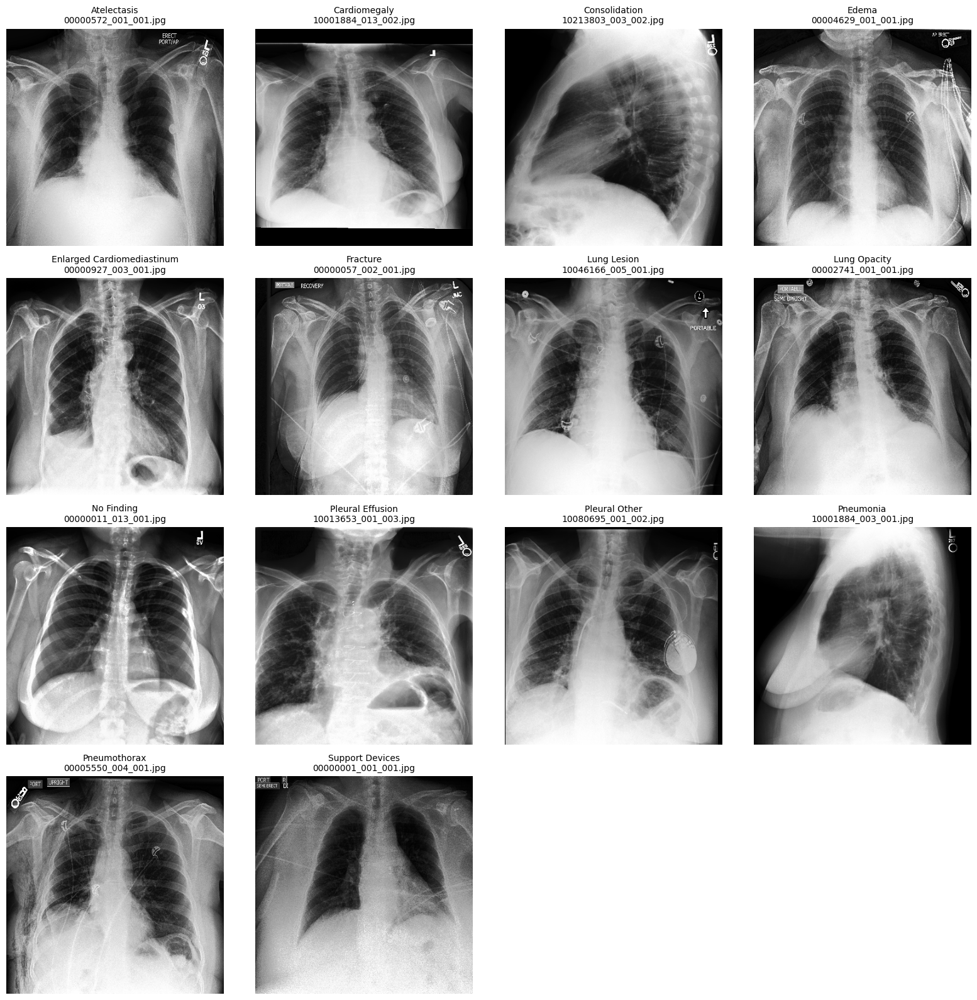

In [9]:
# Find rows that have exactly one positive label
df_single = df[df[Config.TARGET_COLS].sum(axis=1) == 1]

# Collect one example per class
examples = {}
for cls in Config.TARGET_COLS:
    row = df_single[df_single[cls] == 1].head(1)
    if not row.empty:
        examples[cls] = row.iloc[0]

cols = 4
rows = math.ceil(len(examples) / cols)

plt.figure(figsize=(16, 4*rows))

for i, (cls, row) in enumerate(examples.items(), 1):
    img_path = os.path.join(Config.TRAIN_IMG_DIR, row["Image_name"])
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img = cv2.resize(img, (384, 384))

    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"{cls}\n{row['Image_name']}", fontsize=10)

plt.tight_layout()
plt.show()

## Enhanced Data Augmentation

### Purpose
- Increase dataset variability without collecting new data.
- Reduce overfitting by simulating real-world variations (lighting, angle, noise).
- Apply stronger augmentations for minority classes to help balance the dataset.

OneOf = randomly pick ONE transform from the list

### Methods
Train_transforms (minority classes):
- RandomResizedCrop: crops and resizes to simulate zooming in/out.
- HorizontalFlip: flips image left-right.
- RandomRotate90 / Rotate: rotates image by 90° or small random angle.
- ShiftScaleRotate: random shifts, scaling, and slight rotations.
- Noise/Blur (OneOf):
    * GaussNoise: adds sensor-like noise.
    * GaussianBlur: softens edges.
    * MotionBlur: simulates patient movement during scan.
- Distortions (OneOf):
    * OpticalDistortion: mimics lens/scan warping.
    * GridDistortion: grid-based stretching.
    * ElasticTransform: elastic-like bending of image.
- CLAHE: enhances local contrast (useful for highlighting structures).
- RandomBrightnessContrast: changes lighting/contrast conditions.
- RandomGamma: adjusts gamma (brightness curve).
- Normalize: scales pixel values using ImageNet mean/std.
- ToTensorV2: converts to PyTorch tensor.
    
Train_transforms (majority classes):
- Resize: resizes to target input size.
- HorizontalFlip: flips image left-right.
- Rotate: small random rotations.
- RandomBrightnessContrast: mild lighting changes.
- Normalize: ImageNet normalization.
- ToTensorV2: convert to tensor.

Validation Transforms():
- Resize → Normalize → ToTensorV2

Test Transforms():
- Test preprocessing (same as validation).
- Used to ensure consistency at inference.
- Test-Time Augmentation (TTA) is applied separately by running
- inference multiple times with flips/rotations and averaging predictions.


In [10]:
class AdvancedTransforms:
    """Advanced augmentation strategies"""
    @staticmethod
    def get_train_transforms(strong=False):
        """Get training transforms with optional strong augmentation"""
        if strong:
            # Strong augmentation for minority classes
            return A.Compose([
                A.RandomResizedCrop(size=(Config.IMAGE_SIZE, Config.IMAGE_SIZE), 
                                    scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                A.HorizontalFlip(p=0.5),
                A.OneOf([
                    A.RandomRotate90(p=1),
                    A.Rotate(limit=15, p=1)
                ], p=0.3),
                A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, 
                                  rotate_limit=10, p=0.5),
                A.OneOf([
                    A.GaussNoise(var_limit=(10, 50), p=1),
                    A.GaussianBlur(blur_limit=3, p=1),
                    A.MotionBlur(blur_limit=3, p=1),
                ], p=0.3),
                A.OneOf([
                    A.OpticalDistortion(distort_limit=0.05, p=1),
                    A.GridDistortion(num_steps=5, distort_limit=0.05, p=1),
                    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1)
                ], p=0.3),
                A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.4),
                A.RandomBrightnessContrast(brightness_limit=0.2, 
                                          contrast_limit=0.2, p=0.5),
                A.RandomGamma(gamma_limit=(80, 120), p=0.3),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ])
        else:
            # Standard augmentation for majority classes
            return A.Compose([
                A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
                A.HorizontalFlip(p=0.5),
                A.Rotate(limit=10, p=0.3),
                A.RandomBrightnessContrast(brightness_limit=0.1, 
                                          contrast_limit=0.1, p=0.3),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ])
    
    @staticmethod
    def get_val_transforms():
        """Get validation transforms (deterministic)"""
        return A.Compose([
            A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                       std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ])
    
    @staticmethod
    def get_test_transforms():
        """Get test transforms with TTA option"""
        return A.Compose([
            A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
            A.Normalize(mean=(0.485, 0.456, 0.406),
                       std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ])

## Improved Dataset Class

## Advanced Loss Functions

In [11]:
class XrayDataset(Dataset):
    """Enhanced dataset with better augmentation strategy"""
    def __init__(self, df, img_dir, target_cols, minority_classes, 
                 transform_normal=None, transform_strong=None, 
                 mode='train', mixup_alpha=0.2):
        self.df = df.reset_index(drop=True)
        self.img_dir = img_dir
        self.target_cols = target_cols
        self.minority_classes = set(minority_classes)
        self.transform_normal = transform_normal
        self.transform_strong = transform_strong
        self.mode = mode
        self.mixup_alpha = mixup_alpha
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.img_dir, row["Image_name"])
        
        # Load image
        image = cv2.imread(img_path)
        if image is None:
            print(f"Warning: Cannot load image: {img_path}, using black image")
            image = np.zeros((Config.IMAGE_SIZE, Config.IMAGE_SIZE, 3), dtype=np.uint8)
        
        # Convert to RGB (even though X-rays are grayscale)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Get targets
        targets = torch.tensor(row[self.target_cols].values.astype(np.float32))
        
        # Apply transforms based on mode and class
        if self.mode == 'train':
            # Check if sample has minority class
            has_minority = any([row[c] == 1 for c in self.minority_classes])
            
            if has_minority and self.transform_strong:
                image = self.transform_strong(image=image)["image"]
            elif self.transform_normal:
                image = self.transform_normal(image=image)["image"]
        else:
            # Validation/Test mode
            if self.transform_normal:
                image = self.transform_normal(image=image)["image"]
        
        return image, targets, idx
    
    def get_sample_weights(self):
        """Calculate sample weights for balanced sampling"""
        weights = np.zeros(len(self.df))
        
        for idx in range(len(self.df)):
            row = self.df.iloc[idx]
            # Weight based on rarest positive class
            class_weights = []
            for col in self.target_cols:
                if row[col] == 1:
                    weight = class_stats.get(col, {}).get('pos_weight', 1.0)
                    class_weights.append(weight)
            
            if class_weights:
                weights[idx] = max(class_weights)
            else:
                weights[idx] = 1.0
        
        return weights

In [12]:
class FocalLoss(nn.Module):
    """Focal Loss for addressing class imbalance"""
    
    def __init__(self, alpha=0.25, gamma=2.0, pos_weight=None):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.pos_weight = pos_weight
        
    def forward(self, inputs, targets):
        bce_loss = F.binary_cross_entropy_with_logits(
            inputs, targets, reduction='none', pos_weight=self.pos_weight
        )
        
        probs = torch.sigmoid(inputs)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal_weight = (1 - pt) ** self.gamma
        
        if self.alpha is not None:
            alpha_t = torch.where(targets == 1, self.alpha, 1 - self.alpha)
            focal_weight = alpha_t * focal_weight
        
        loss = focal_weight * bce_loss
        return loss.mean()

In [13]:
class AsymmetricLoss(nn.Module):
    """Asymmetric Loss for multi-label classification"""
    
    def __init__(self, gamma_neg=4, gamma_pos=1, clip=0.05, eps=1e-8):
        super().__init__()
        self.gamma_neg = gamma_neg
        self.gamma_pos = gamma_pos
        self.clip = clip
        self.eps = eps
        
    def forward(self, inputs, targets):
        # Calculating Probabilities
        probs = torch.sigmoid(inputs)
        probs = torch.clamp(probs, min=self.eps, max=1-self.eps)
        
        # Asymmetric Clipping
        probs_pos = torch.where(targets == 1, probs, torch.zeros_like(probs))
        probs_neg = torch.where(targets == 0, probs, torch.zeros_like(probs))
        
        # Asymmetric Focusing
        loss_pos = targets * torch.log(probs_pos + self.eps) * (1 - probs_pos)**self.gamma_pos
        loss_neg = (1 - targets) * torch.log(1 - probs_neg + self.eps) * probs_neg**self.gamma_neg
        
        loss = -torch.mean(loss_pos + loss_neg)
        return loss

## Model Architecture with Attention

In [14]:
class AttentionPool2d(nn.Module):
    """Attention-based pooling layer"""
    
    def __init__(self, in_features, out_features=1):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Linear(in_features, in_features // 16),
            nn.ReLU(inplace=True),
            nn.Linear(in_features // 16, out_features)
        )
        
    def forward(self, x):
        # x shape: (batch, channels, h, w)
        b, c, h, w = x.size()
        x = x.view(b, c, -1).permute(0, 2, 1)  # (b, h*w, c)
        
        att_weights = F.softmax(self.attention(x), dim=1)  # (b, h*w, 1)
        x = (x * att_weights).sum(dim=1)  # (b, c)
        
        return x

In [15]:
class ImprovedResNet50(nn.Module):
    """ResNet50 with attention pooling and multi-scale features"""
    
    def __init__(self, num_classes, pretrained=True, dropout=0.3):
        super().__init__()
        
        # Load pretrained ResNet50
        weights = ResNet50_Weights.IMAGENET1K_V1 if pretrained else None
        self.backbone = models.resnet50(weights=weights)
        
        # Remove the final FC layer
        self.features = nn.Sequential(*list(self.backbone.children())[:-2])
        
        # Attention pooling
        self.attention_pool = AttentionPool2d(2048, 1)
        
        # Classification head with dropout
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(2048, num_classes)
        
        # Initialize new layers
        nn.init.xavier_normal_(self.fc.weight)
        nn.init.constant_(self.fc.bias, 0)
        
    def forward(self, x):
        # Extract features
        features = self.features(x)  # (b, 2048, h, w)
        
        # Attention pooling
        pooled = self.attention_pool(features)  # (b, 2048)
        
        # Classification
        x = self.dropout(pooled)
        output = self.fc(x)
        
        return output

## Training Utilities

In [16]:
class EarlyStopping:
    """Early stopping to prevent overfitting"""
    
    def __init__(self, patience=5, delta=0.001, mode='max'):
        self.patience = patience
        self.delta = delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.mode = mode
        
    def __call__(self, score):
        if self.best_score is None:
            self.best_score = score
            return False
        
        if self.mode == 'max':
            improved = score > self.best_score + self.delta
        else:
            improved = score < self.best_score - self.delta
        
        if improved:
            self.best_score = score
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        
        return self.early_stop

In [17]:
class MetricTracker:
    """Track and store training metrics"""
    
    def __init__(self):
        self.metrics = defaultdict(list)
        
    def update(self, metric_dict):
        for key, value in metric_dict.items():
            self.metrics[key].append(value)
    
    def get_best(self, metric, mode='max'):
        values = self.metrics[metric]
        if mode == 'max':
            best_idx = np.argmax(values)
        else:
            best_idx = np.argmin(values)
        return best_idx, values[best_idx]
    
    def save(self, filepath):
        with open(filepath, 'w') as f:
            json.dump(self.metrics, f, indent=2)

def find_optimal_thresholds(targets, predictions, beta=2):
    """Find optimal threshold for each class using F-beta score"""
    thresholds = {}
    
    for i, col in enumerate(Config.TARGET_COLS):
        precision, recall, thresh = precision_recall_curve(
            targets[:, i], predictions[:, i]
        )
        
        # F-beta score
        fbeta = (1 + beta**2) * precision * recall / (beta**2 * precision + recall + 1e-8)
        
        # Find optimal threshold
        best_idx = np.argmax(fbeta[:-1])  # Exclude last element
        thresholds[col] = float(thresh[best_idx])
    
    return thresholds

## Model Training

In [18]:
def train_epoch(model, dataloader, criterion, optimizer, device, accumulation_steps=1):
    """Train for one epoch with gradient accumulation"""
    model.train()
    running_loss = 0.0
    scaler = torch.cuda.amp.GradScaler()
        
    pbar = tqdm(dataloader, desc='Training')
    optimizer.zero_grad()
    
    for i, (images, targets, _) in enumerate(pbar):
        images = images.to(device)
        targets = targets.to(device)
        
        # Mixed precision training
        with torch.cuda.amp.autocast():
            outputs = model(images)
            loss = criterion(outputs, targets)
            loss = loss / accumulation_steps
        
        # Backward pass
        scaler.scale(loss).backward()
        
        # Update weights
        if (i + 1) % accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()
        
        # Update metrics
        running_loss += loss.item() * accumulation_steps * images.size(0)
        pbar.set_postfix({'loss': loss.item() * accumulation_steps})
    
    epoch_loss = running_loss / len(dataloader.dataset)
    return epoch_loss

In [19]:
def validate_epoch(model, dataloader, criterion, device):
    """Validate for one epoch"""
    model.eval()
    running_loss = 0.0
    all_outputs = []
    all_targets = []
    
    with torch.no_grad():
        pbar = tqdm(dataloader, desc='Validation')
        for images, targets, _ in pbar:
            images = images.to(device)
            targets = targets.to(device)
            
            with torch.cuda.amp.autocast():
                outputs = model(images)
                loss = criterion(outputs, targets)
            
            running_loss += loss.item() * images.size(0)
            
            # Store predictions
            all_outputs.append(torch.sigmoid(outputs).cpu().numpy())
            all_targets.append(targets.cpu().numpy())
            
            pbar.set_postfix({'loss': loss.item()})
    
    epoch_loss = running_loss / len(dataloader.dataset)
    all_outputs = np.vstack(all_outputs)
    all_targets = np.vstack(all_targets)
    
    # Calculate metrics
    metrics = calculate_metrics(all_targets, all_outputs)
    
    return epoch_loss, all_outputs, all_targets, metrics

### Overall Metrics
- auc_macro → Macro-averaged Area Under the ROC Curve (treats all classes equally).
- auc_weighted → Weighted Area Under the ROC Curve (accounts for class imbalance).
- ap_macro → Macro-averaged Average Precision (precision-recall curve).

### Per-Class Metric
- auc_(class) → ROC-AUC score for each individual target class.

### Threshold-based Metrics
- f1_macro → Macro-averaged F1 score (treats all classes equally) at threshold 0.5.
- f1_weighted → Weighted F1 score (accounts for class imbalance) at threshold 0.5.

In [20]:
def calculate_metrics(targets, predictions):
    """Calculate comprehensive metrics"""
    metrics = {}
    
    # Overall metrics
    try:
        metrics['auc_macro'] = roc_auc_score(targets, predictions, average='macro')
        metrics['auc_weighted'] = roc_auc_score(targets, predictions, average='weighted')
        metrics['ap_macro'] = average_precision_score(targets, predictions, average='macro')
        
        # Per-class AUC
        auc_per_class = roc_auc_score(targets, predictions, average=None)
        for i, col in enumerate(Config.TARGET_COLS):
            metrics[f'auc_{col}'] = auc_per_class[i]
        
        # F1 scores with 0.5 threshold
        binary_preds = (predictions > 0.5).astype(int)
        metrics['f1_macro'] = f1_score(targets, binary_preds, average='macro')
        metrics['f1_weighted'] = f1_score(targets, binary_preds, average='weighted')
        
    except Exception as e:
        print(f"Error calculating metrics: {e}")
    
    return metrics

## Main Training Pipeline

1. Device setup → CPU/GPU selection.
2. Data split → Train/validation split using train_test_split().
3. Transforms → Create normal and strong augmentations for training; deterministic transforms for validation.
4. Dataset creation → XrayDataset for train/val, applying appropriate transforms.
5. Weighted sampler → Handle class imbalance during training.
6. Dataloaders → Efficient data loading with DataLoader.
7. Model → Initialize ImprovedResNet50 with dropout and pretrained weights.
8. Loss function → FocalLoss with class-wise weights.
9. Optimizer & Scheduler → AdamW optimizer and ReduceLROnPlateau scheduler.
10. Training loop
    - Train for each epoch.
    - Validate and calculate metrics (AUC, AP, F1).
    - Save best model based on macro AUC.
    - Track metrics and apply early stopping.
11. Post-training
    - Save metrics and optimal thresholds.
    - Return trained model, metric tracker, and thresholds.

In [21]:
def main_training_pipeline():
    """Main training pipeline with all improvements"""
    
    # Make variables global for access in other functions
    global train_df, val_df, class_stats, minority_classes
    
    # Split data
    train_df, val_df = train_test_split(
        df, test_size=Config.VAL_SPLIT, 
        random_state=Config.RANDOM_SEED, 
        shuffle=True
    )
    
    print(f"Train samples: {len(train_df)}, Val samples: {len(val_df)}")
    
    # Create transforms
    transforms = AdvancedTransforms()
    train_transform_normal = transforms.get_train_transforms(strong=False)
    train_transform_strong = transforms.get_train_transforms(strong=True)
    val_transform = transforms.get_val_transforms()
    
    # Create datasets
    train_dataset = XrayDataset(
        train_df, Config.TRAIN_IMG_DIR, Config.TARGET_COLS,
        minority_classes, train_transform_normal, train_transform_strong,
        mode='train'
    )
    
    val_dataset = XrayDataset(
        val_df, Config.TRAIN_IMG_DIR, Config.TARGET_COLS,
        minority_classes, val_transform, None,
        mode='val'
    )
    
    # Create weighted sampler for training
    sample_weights = train_dataset.get_sample_weights()
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True
    )
    
    # Create dataloaders
    train_loader = DataLoader(
        train_dataset, batch_size=Config.BATCH_SIZE,
        sampler=sampler, num_workers=Config.NUM_WORKERS,
        pin_memory=True
    )
    
    val_loader = DataLoader(
        val_dataset, batch_size=Config.BATCH_SIZE,
        shuffle=False, num_workers=Config.NUM_WORKERS,
        pin_memory=True
    )
    
    # Initialize model
    model = ImprovedResNet50(
        num_classes=len(Config.TARGET_COLS),
        pretrained=True,
        dropout=0.3
    ).to(device)
    
    # Loss function with class weights
    pos_weights = torch.tensor([
        class_stats[col]['pos_weight'] for col in Config.TARGET_COLS
    ]).to(device)
    
    criterion = FocalLoss(
        alpha=Config.FOCAL_ALPHA,
        gamma=Config.FOCAL_GAMMA,
        pos_weight=pos_weights
    )
    
    # Optimizer
    optimizer = optim.AdamW(
        model.parameters(),
        lr=Config.LEARNING_RATE,
        weight_decay=Config.WEIGHT_DECAY
    )
    
    # Scheduler
    scheduler = ReduceLROnPlateau(
        optimizer, mode='max', patience=3, 
        factor=0.5, verbose=True
    )
    
    scaler = torch.cuda.amp.GradScaler()
    early_stopping = EarlyStopping(patience=Config.EARLY_STOPPING_PATIENCE)
    metric_tracker = MetricTracker()
    
    best_auc = 0
    optimal_thresholds = {}  # Initialize to avoid undefined variable
    
    # Training loop
    print("\n" + "=" * 50)
    print("STARTING TRAINING")
    print("=" * 50)
    
    for epoch in range(Config.NUM_EPOCHS):
        print(f"\nEpoch {epoch+1}/{Config.NUM_EPOCHS}")
        print("-" * 30)
        
        # Train
        train_loss = train_epoch(
            model, train_loader, criterion, optimizer, 
            device, Config.ACCUMULATION_STEPS
        )
        
        # Validate
        val_loss, val_outputs, val_targets, val_metrics = validate_epoch(
            model, val_loader, criterion, device
        )
        
        # Update scheduler
        scheduler.step(val_metrics['auc_macro'])
        
        # Track metrics
        metric_tracker.update({
            'epoch': epoch + 1,
            'train_loss': train_loss,
            'val_loss': val_loss,
            **val_metrics
        })
        
        # Print metrics
        print(f"Train Loss: {train_loss:.4f}")
        print(f"Val Loss: {val_loss:.4f}")
        print(f"Val AUC (macro): {val_metrics['auc_macro']:.4f}")
        print(f"Val AP (macro): {val_metrics['ap_macro']:.4f}")
        print(f"Val F1 (macro): {val_metrics['f1_macro']:.4f}")
        
        # Save best model
        if val_metrics['auc_macro'] > best_auc:
            best_auc = val_metrics['auc_macro']
            torch.save({
                'epoch': epoch + 1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'best_auc': best_auc,
                'val_metrics': val_metrics,
                'config': {k: v for k, v in Config.__dict__.items() if not k.startswith('__')}
            }, 'best_model.pth')
            print(f"✅ Saved best model with AUC: {best_auc:.4f}")
            
            # Find optimal thresholds on best model
            optimal_thresholds = find_optimal_thresholds(val_targets, val_outputs)
            with open('optimal_thresholds.json', 'w') as f:
                json.dump(optimal_thresholds, f, indent=2)
        
        # Early stopping
        if early_stopping(val_metrics['auc_macro']):
            print(f"\n⚠️ Early stopping triggered at epoch {epoch+1}")
            break
    
    # Save metrics
    metric_tracker.save('training_metrics.json')
    
    return model, metric_tracker, optimal_thresholds

# Run training
model, metric_tracker, optimal_thresholds = main_training_pipeline()

Train samples: 91267, Val samples: 16107


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 214MB/s]



STARTING TRAINING

Epoch 1/5
------------------------------


Training:   0%|          | 0/5705 [00:00<?, ?it/s]

Validation:   0%|          | 0/1007 [00:00<?, ?it/s]

Train Loss: 0.0934
Val Loss: 0.0799
Val AUC (macro): 0.8604
Val AP (macro): 0.6555
Val F1 (macro): 0.5801
✅ Saved best model with AUC: 0.8604

Epoch 2/5
------------------------------


Training:   0%|          | 0/5705 [00:00<?, ?it/s]

Validation:   0%|          | 0/1007 [00:00<?, ?it/s]

Train Loss: 0.0844
Val Loss: 0.0769
Val AUC (macro): 0.8700
Val AP (macro): 0.6779
Val F1 (macro): 0.6177
✅ Saved best model with AUC: 0.8700

Epoch 3/5
------------------------------


Training:   0%|          | 0/5705 [00:00<?, ?it/s]

Validation:   0%|          | 0/1007 [00:00<?, ?it/s]

Train Loss: 0.0805
Val Loss: 0.0948
Val AUC (macro): 0.8689
Val AP (macro): 0.6768
Val F1 (macro): 0.5972

Epoch 4/5
------------------------------


Training:   0%|          | 0/5705 [00:00<?, ?it/s]

Validation:   0%|          | 0/1007 [00:00<?, ?it/s]

Train Loss: 0.0781
Val Loss: 0.0979
Val AUC (macro): 0.8632
Val AP (macro): 0.6701
Val F1 (macro): 0.6032

Epoch 5/5
------------------------------


Training:   0%|          | 0/5705 [00:00<?, ?it/s]

Validation:   0%|          | 0/1007 [00:00<?, ?it/s]

Train Loss: 0.0761
Val Loss: 0.0927
Val AUC (macro): 0.8754
Val AP (macro): 0.6872
Val F1 (macro): 0.6240
✅ Saved best model with AUC: 0.8754


## Visualization of Results

In [22]:
def plot_training_history(metric_tracker):
    """Plot comprehensive training history"""
    metrics = metric_tracker.metrics
    
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Loss Curves', 'AUC Scores', 'F1 Scores', 'Per-Class AUC')
    )
    
    epochs = metrics['epoch']
    
    # Loss curves
    fig.add_trace(
        go.Scatter(x=epochs, y=metrics['train_loss'], name='Train Loss'),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=epochs, y=metrics['val_loss'], name='Val Loss'),
        row=1, col=1
    )
    
    # AUC scores
    fig.add_trace(
        go.Scatter(x=epochs, y=metrics['auc_macro'], name='AUC Macro'),
        row=1, col=2
    )
    fig.add_trace(
        go.Scatter(x=epochs, y=metrics['auc_weighted'], name='AUC Weighted'),
        row=1, col=2
    )
    
    # F1 scores
    fig.add_trace(
        go.Scatter(x=epochs, y=metrics['f1_macro'], name='F1 Macro'),
        row=2, col=1
    )
    fig.add_trace(
        go.Scatter(x=epochs, y=metrics['f1_weighted'], name='F1 Weighted'),
        row=2, col=1
    )
    
    # Per-class AUC
    for col in Config.TARGET_COLS[:5]:  # Show top 5 classes
        if f'auc_{col}' in metrics:
            fig.add_trace(
                go.Scatter(x=epochs, y=metrics[f'auc_{col}'], name=col),
                row=2, col=2
            )
    
    fig.update_layout(height=800, showlegend=True, title_text="Training History")
    fig.show()


In [23]:
class GradCAM:
    def __init__(self, model, target_layer=None):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.activations = None
        self.handles = []

        # Set target layer - fixed for ImprovedResNet50
        if target_layer is None:
            # Access the last convolutional layer through the features Sequential
            try:
                # For ImprovedResNet50, the features contain the ResNet layers
                self.target_layer = model.features[-1][-1].conv3  # layer4[-1].conv3
            except (AttributeError, IndexError):
                # Alternative: try to find the last conv layer
                try:
                    self.target_layer = model.features[-1][-1]  # Last block
                except:
                    raise ValueError("Cannot automatically find target layer. Please specify manually.")
        else:
            self.target_layer = target_layer

        # Register hooks
        self.handles.append(self.target_layer.register_forward_hook(self.save_activation))
        self.handles.append(self.target_layer.register_full_backward_hook(self.save_gradient))

    def save_activation(self, module, input, output):
        self.activations = output.detach()

    def save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate_heatmap(self, input_image, class_idx=None):
        self.model.zero_grad()
        
        # Forward pass
        output = self.model(input_image)
        
        # If no class specified, use the most confident prediction
        if class_idx is None:
            probs = torch.sigmoid(output)
            class_idx = probs.argmax(dim=1).item()
        
        # Create one-hot output for the target class
        one_hot = torch.zeros_like(output)
        one_hot[0, class_idx] = 1.0
        
        # Backward pass
        output.backward(gradient=one_hot, retain_graph=True)
        
        # Check if gradients were captured
        if self.gradients is None:
            raise RuntimeError("Gradients not captured. Check if target layer is correct.")
        
        # Calculate weights
        gradients = self.gradients[0].cpu().numpy()
        activations = self.activations[0].cpu().numpy()
        
        # Global average pooling on gradients
        weights = np.mean(gradients, axis=(1, 2))
        
        # Weighted combination of activation maps
        heatmap = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            heatmap += w * activations[i]
        
        # ReLU and normalize
        heatmap = np.maximum(heatmap, 0)
        if heatmap.max() > 0:
            heatmap /= heatmap.max()
        
        return heatmap

    def cleanup(self):
        for handle in self.handles:
            handle.remove()

In [24]:
def visualize_gradcam_for_all_targets(model, image_path, target_cols, device, transform):
    
    # Load and preprocess image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Cannot load image: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Apply transforms
    transformed = transform(image=image)
    input_tensor = transformed["image"].unsqueeze(0).to(device)
    
    # Get model predictions
    model.eval()
    with torch.no_grad():
        preds = torch.sigmoid(model(input_tensor))[0].cpu().numpy()
    
    # Initialize GradCAM
    gradcam = GradCAM(model)
    
    # Create subplot grid
    n_cols = 4
    n_rows = (len(target_cols) + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    axes = axes.flatten()
    
    # Resize original image for display
    display_img = cv2.resize(image, (384, 384)) 
    
    # Generate heatmap for each class
    for i, cls_name in enumerate(target_cols):
        try:
            # Generate heatmap
            heatmap = gradcam.generate_heatmap(input_tensor, class_idx=i)
            
            # Resize heatmap to match image size
            heatmap_resized = cv2.resize(heatmap, (384, 384))
            
            # Apply colormap
            heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
            heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
            
            # Create overlay
            overlay = cv2.addWeighted(display_img, 0.6, heatmap_colored, 0.4, 0)
            
            # Display
            ax = axes[i]
            ax.imshow(overlay)
            ax.set_title(f"{cls_name}\nScore: {preds[i]:.3f}", fontsize=10)
            ax.axis("off")
        except Exception as e:
            print(f"Error generating heatmap for {cls_name}: {str(e)}")
            axes[i].axis("off")
    
    # Hide unused subplots
    for j in range(len(target_cols), len(axes)):
        axes[j].axis("off")
    
    plt.suptitle(f"GradCAM Visualization: {os.path.basename(image_path)}", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    # Cleanup
    gradcam.cleanup()

In [25]:
def visualize_gradcam_samples(model, val_df, Config, device):
    
    # Get transform
    transform = AdvancedTransforms.get_val_transforms()
    
    # Get unique samples for each disease
    unique_samples = {}
    for disease in Config.TARGET_COLS:
        disease_samples = val_df[val_df[disease] == 1]
        if len(disease_samples) > 0:
            sample_row = disease_samples.sample(n=1).iloc[0]
            unique_samples[disease] = os.path.join(Config.TRAIN_IMG_DIR, sample_row["Image_name"])
    
    # Visualize first 3 diseases
    for i, (disease, image_path) in enumerate(list(unique_samples.items())[:3]):
        print(f"\nVisualizing GradCAM for {disease}: {os.path.basename(image_path)}")
        try:
            visualize_gradcam_for_all_targets(
                model, image_path, Config.TARGET_COLS, device, transform
            )
        except Exception as e:
            print(f"Error visualizing {disease}: {str(e)}")
            print(f"Debug info - Model structure:")
            print(f"  - Has 'features' attr: {hasattr(model, 'features')}")
            if hasattr(model, 'features'):
                print(f"  - Features length: {len(model.features)}")
        
        if i >= 2:  # Limit to 3 visualizations
            break


GRADCAM VISUALIZATION

Visualizing GradCAM for Atelectasis: 00017409_002_002.jpg


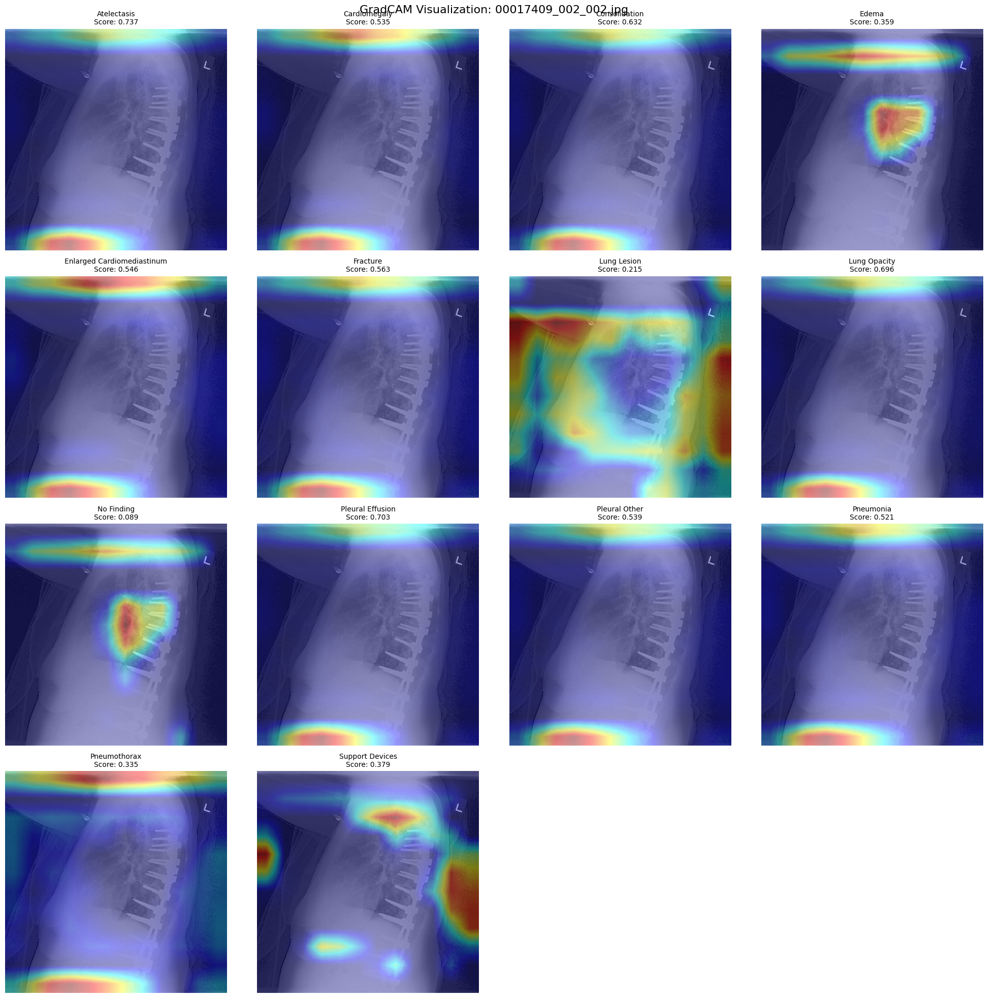


Visualizing GradCAM for Cardiomegaly: 00044303_002_001.jpg


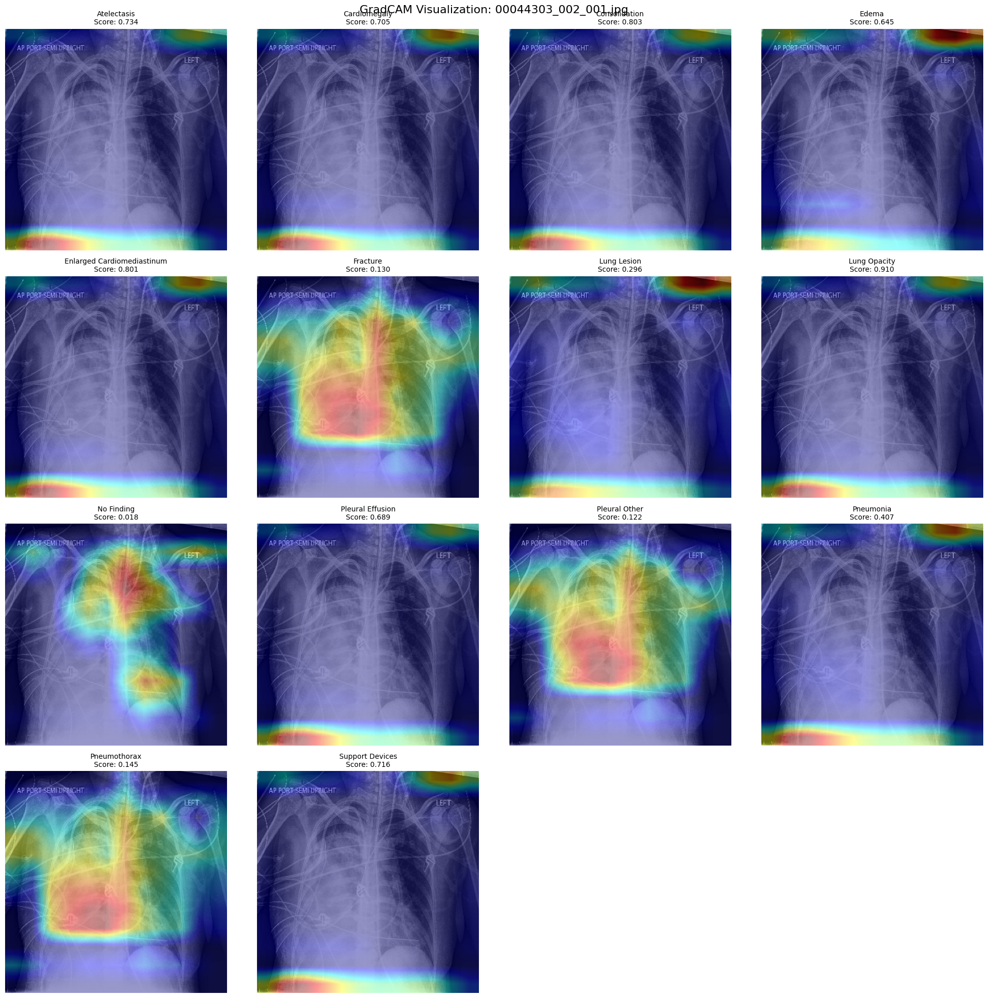


Visualizing GradCAM for Consolidation: 00044679_004_001.jpg


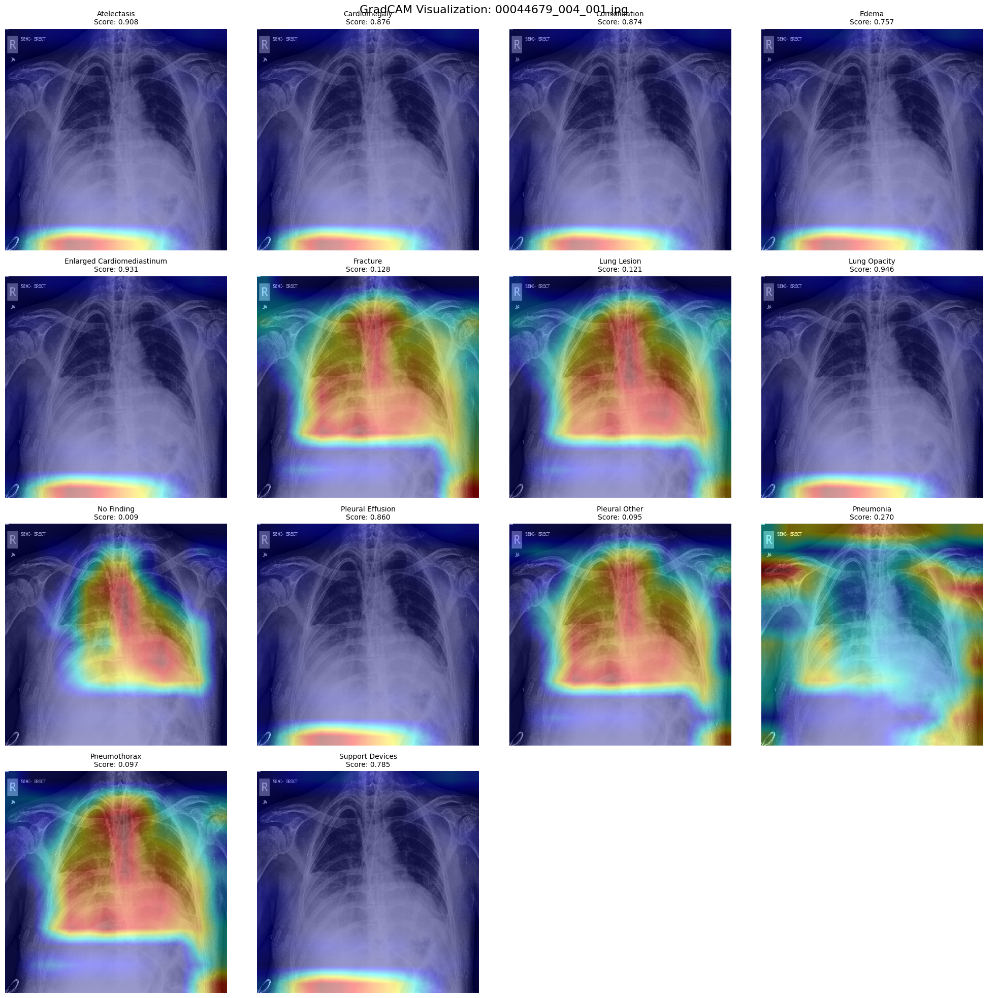

In [26]:
if model and 'val_df' in globals():
    print("\n" + "="*50)
    print("GRADCAM VISUALIZATION")
    print("="*50)
    visualize_gradcam_samples(model, val_df, Config, device=device)
else:
    print("Model training not completed yet. Train the model first before visualization.")

## Test Time Augmentation (TTA) and Inference

### Purpose
Test-Time Augmentation (TTA) is a technique where we apply multiple transformations to a test image, run the model on each transformed image, and then average the predictions.

### Why use it?
1. Improves model robustness at inference.
2. Reduces sensitivity to small changes in image orientation, brightness, or scale.
3. Especially useful in medical imaging (e.g., X-rays) where subtle changes can affect predictions.

In [27]:
class TTAWrapper:
    """Test Time Augmentation wrapper"""
    
    def __init__(self, model, device, n_augmentations=5):
        self.model = model
        self.device = device
        self.n_augmentations = n_augmentations
        
        # Define TTA transforms
        self.tta_transforms = [
            A.Compose([
                A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ]),
            A.Compose([
                A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
                A.HorizontalFlip(p=1.0),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ]),
            A.Compose([
                A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
                A.Rotate(limit=10, p=1.0),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ]),
            A.Compose([
                A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
                A.RandomBrightnessContrast(brightness_limit=0.1, 
                                          contrast_limit=0.1, p=1.0),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ]),
            A.Compose([
                A.Resize(Config.IMAGE_SIZE, Config.IMAGE_SIZE),
                A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, 
                                  rotate_limit=5, p=1.0),
                A.Normalize(mean=(0.485, 0.456, 0.406),
                           std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ])
        ]
    
    def predict(self, image):
        """Predict with TTA"""
        predictions = []
        
        for transform in self.tta_transforms[:self.n_augmentations]:
            # Apply transform
            aug_image = transform(image=image)["image"]
            aug_image = aug_image.unsqueeze(0).to(self.device)
            
            # Predict
            with torch.no_grad():
                with torch.cuda.amp.autocast():
                    output = torch.sigmoid(self.model(aug_image))
            
            predictions.append(output.cpu().numpy())
        
        # Average predictions
        return np.mean(predictions, axis=0)

In [28]:
class TestDataset(Dataset):
    """Test dataset with optional TTA"""
    
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        self.img_files = sorted([
            f for f in os.listdir(img_dir) 
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])
        self.transform = transform
    
    def __len__(self):
        return len(self.img_files)
    
    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if self.transform:
            image = self.transform(image=image)["image"]
        
        return image, img_name

In [29]:
def inference_with_tta(model, test_loader, device, use_tta=True, optimal_thresholds=None):
    """Run inference with optional TTA"""
    model.eval()
    
    if use_tta:
        tta_wrapper = TTAWrapper(model, device, n_augmentations=5)
        print("Using Test Time Augmentation (5 augmentations)")
    
    predictions = {}
    
    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Inference')
        for images, img_names in pbar:
            if use_tta:
                # TTA prediction (process one by one)
                batch_preds = []
                for img, name in zip(images, img_names):
                    img_np = img.numpy().transpose(1, 2, 0)
                    # Denormalize
                    img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                    img_np = (img_np * 255).astype(np.uint8)
                    
                    pred = tta_wrapper.predict(img_np)
                    batch_preds.append(pred)
                
                batch_preds = np.vstack(batch_preds)
            else:
                # Standard prediction
                images = images.to(device)
                with torch.cuda.amp.autocast():
                    outputs = torch.sigmoid(model(images))
                batch_preds = outputs.cpu().numpy()
            
            # Store predictions
            for name, pred in zip(img_names, batch_preds):
                predictions[name] = pred
    
    # Apply optimal thresholds if provided
    if optimal_thresholds:
        print("Applying optimal thresholds")
        binary_predictions = {}
        for name, pred in predictions.items():
            binary_pred = np.zeros_like(pred)
            for i, col in enumerate(Config.TARGET_COLS):
                threshold = optimal_thresholds.get(col, 0.5)
                binary_pred[i] = (pred[i] > threshold).astype(int)
            binary_predictions[name] = binary_pred
        return predictions, binary_predictions
    
    return predictions, None

## Generate Final Submission

In [30]:
def generate_submission():
    """Generate final submission with error handling"""
    
    # Check if required files exist
    if not os.path.exists('best_model.pth'):
        print("Error: best_model.pth not found. Please train the model first.")
        return None
    
    if not os.path.exists('optimal_thresholds.json'):
        print("Warning: optimal_thresholds.json not found. Using default threshold of 0.5")
        optimal_thresholds = {col: 0.5 for col in Config.TARGET_COLS}
    else:
        with open('optimal_thresholds.json', 'r') as f:
            optimal_thresholds = json.load(f)
    
    # Load best model
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = ImprovedResNet50(
        num_classes=len(Config.TARGET_COLS),
        pretrained=False
    ).to(device)
    
    checkpoint = torch.load('best_model.pth', weights_only=False, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Loaded best model from epoch {checkpoint['epoch']} with AUC: {checkpoint['best_auc']:.4f}")
    
    # Check if test directory exists
    if not os.path.exists(Config.TEST_IMG_DIR):
        print(f"Error: Test directory {Config.TEST_IMG_DIR} not found")
        return None
    
    # Create test dataset
    test_transform = AdvancedTransforms.get_test_transforms()
    test_dataset = TestDataset(Config.TEST_IMG_DIR, test_transform)
    
    if len(test_dataset) == 0:
        print("Error: No test images found")
        return None
    
    test_loader = DataLoader(
        test_dataset, batch_size=Config.BATCH_SIZE,
        shuffle=False, num_workers=Config.NUM_WORKERS
    )
    
    # Run inference with TTA
    predictions, binary_predictions = inference_with_tta(
        model, test_loader, device, 
        use_tta=True, optimal_thresholds=optimal_thresholds
    )
    
    # Create submission DataFrame
    submission_data = []
    for img_name in sorted(predictions.keys()):
        row = {'Image_name': img_name}
        binary_pred = binary_predictions[img_name] if binary_predictions else (predictions[img_name] > 0.5).astype(int)
        
        for i, col in enumerate(Config.TARGET_COLS):
            row[col] = int(binary_pred[i])
        
        submission_data.append(row)
    
    submission_df = pd.DataFrame(submission_data)
    
    # Reorder columns
    cols = ['Image_name'] + Config.TARGET_COLS
    submission_df = submission_df[cols]
    
    # Save submission
    submission_df.to_csv('submission_improved.csv', index=False)
    print(f"\n✅ Submission saved: submission_improved.csv")
    print(f"Shape: {submission_df.shape}")
    print("\nFirst 5 predictions:")
    print(submission_df.head())
    
    # Save probability predictions for ensemble
    with open('test_predictions_proba.pkl', 'wb') as f:
        import pickle
        pickle.dump(predictions, f)
    print("\n📊 Probability predictions saved for potential ensemble")
    
    return submission_df

## Model Analysis and Interpretability

In [31]:
def analyze_model_predictions(model, val_loader, device):
    """Analyze model performance and generate insights"""
    
    model.eval()
    all_outputs = []
    all_targets = []
    
    with torch.no_grad():
        for images, targets, _ in tqdm(val_loader, desc='Analyzing'):
            images = images.to(device)
            outputs = torch.sigmoid(model(images))
            
            all_outputs.append(outputs.cpu().numpy())
            all_targets.append(targets.numpy())
    
    all_outputs = np.vstack(all_outputs)
    all_targets = np.vstack(all_targets)
    
    # Per-class performance
    class_performance = {}
    
    for i, col in enumerate(Config.TARGET_COLS):
        y_true = all_targets[:, i]
        y_pred = all_outputs[:, i]
        
        # Skip if no positive samples
        if y_true.sum() == 0:
            continue
        
        # Calculate metrics
        auc = roc_auc_score(y_true, y_pred)
        ap = average_precision_score(y_true, y_pred)
        
        # Find optimal threshold
        fpr, tpr, thresholds = roc_curve(y_true, y_pred)
        optimal_idx = np.argmax(tpr - fpr)
        optimal_threshold = thresholds[optimal_idx]
        
        # Calculate F1 at optimal threshold
        y_pred_binary = (y_pred > optimal_threshold).astype(int)
        f1 = f1_score(y_true, y_pred_binary)
        
        class_performance[col] = {
            'auc': auc,
            'ap': ap,
            'f1': f1,
            'optimal_threshold': optimal_threshold,
            'prevalence': y_true.mean()
        }
    
    # Create performance DataFrame
    perf_df = pd.DataFrame(class_performance).T
    perf_df = perf_df.sort_values('auc', ascending=False)
    
    # Visualize
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # AUC by class
    ax = axes[0, 0]
    perf_df['auc'].plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('AUC-ROC')
    ax.set_title('AUC-ROC by Class')
    ax.set_xlim([0, 1])
    
    # F1 by class
    ax = axes[0, 1]
    perf_df['f1'].plot(kind='barh', ax=ax, color='lightgreen')
    ax.set_xlabel('F1 Score')
    ax.set_title('F1 Score by Class')
    ax.set_xlim([0, 1])
    
    # Prevalence vs Performance
    ax = axes[1, 0]
    ax.scatter(perf_df['prevalence'], perf_df['auc'], s=100, alpha=0.6)
    for idx, row in perf_df.iterrows():
        ax.annotate(idx, (row['prevalence'], row['auc']), fontsize=8)
    ax.set_xlabel('Class Prevalence')
    ax.set_ylabel('AUC-ROC')
    ax.set_title('Class Prevalence vs Performance')
    
    # Confusion matrix for top classes
    ax = axes[1, 1]
    top_classes = perf_df.head(5).index.tolist()
    confusion_data = []
    
    for i, col in enumerate(Config.TARGET_COLS):
        if col in top_classes:
            y_true = all_targets[:, i]
            y_pred = (all_outputs[:, i] > 0.5).astype(int)
            tp = ((y_true == 1) & (y_pred == 1)).sum()
            fp = ((y_true == 0) & (y_pred == 1)).sum()
            fn = ((y_true == 1) & (y_pred == 0)).sum()
            tn = ((y_true == 0) & (y_pred == 0)).sum()
            
            sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
            specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
            
            confusion_data.append({
                'Class': col,
                'Sensitivity': sensitivity,
                'Specificity': specificity
            })
    
    conf_df = pd.DataFrame(confusion_data)
    conf_df.set_index('Class')[['Sensitivity', 'Specificity']].plot(
        kind='bar', ax=ax, color=['coral', 'lightblue']
    )
    ax.set_ylabel('Score')
    ax.set_title('Sensitivity vs Specificity (Top 5 Classes)')
    ax.set_ylim([0, 1])
    ax.legend()
    
    plt.tight_layout()
    plt.savefig('model_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("\n" + "=" * 50)
    print("MODEL PERFORMANCE SUMMARY")
    print("=" * 50)
    print(perf_df.round(3))
    
    return perf_df

## Save Final Artifacts

In [32]:
print("\n" + "=" * 50)
print("TRAINING COMPLETE - ARTIFACTS SAVED")
print("=" * 50)
print("✅ best_model.pth - Best model checkpoint")
print("✅ optimal_thresholds.json - Optimal classification thresholds")
print("✅ training_metrics.json - Complete training history")
print("✅ submission_improved.csv - Final predictions")
print("✅ test_predictions_proba.npy - Probability predictions for ensemble")
print("✅ model_analysis.png - Performance visualization")

print("\n📊 Best Validation Metrics:")
checkpoint = torch.load('best_model.pth', weights_only=False)
for key, value in checkpoint['val_metrics'].items():
    if isinstance(value, float):
        print(f"  {key}: {value:.4f}")


TRAINING COMPLETE - ARTIFACTS SAVED
✅ best_model.pth - Best model checkpoint
✅ optimal_thresholds.json - Optimal classification thresholds
✅ training_metrics.json - Complete training history
✅ submission_improved.csv - Final predictions
✅ test_predictions_proba.npy - Probability predictions for ensemble
✅ model_analysis.png - Performance visualization

📊 Best Validation Metrics:
  auc_macro: 0.8754
  auc_weighted: 0.9041
  ap_macro: 0.6872
  auc_Atelectasis: 0.9008
  auc_Cardiomegaly: 0.9335
  auc_Consolidation: 0.9266
  auc_Edema: 0.9218
  auc_Enlarged Cardiomediastinum: 0.9700
  auc_Fracture: 0.8419
  auc_Lung Lesion: 0.7219
  auc_Lung Opacity: 0.9001
  auc_No Finding: 0.8954
  auc_Pleural Effusion: 0.9078
  auc_Pleural Other: 0.7855
  auc_Pneumonia: 0.8122
  auc_Pneumothorax: 0.7790
  auc_Support Devices: 0.9595
  f1_macro: 0.6240
  f1_weighted: 0.7164
